In [5]:
%matplotlib inline

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import kagglehub
import pathlib
from shutil import copy2
from tensorflow.keras import models, layers, Input, Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import plot_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from tqdm import tqdm
from pathlib import Path
from ultralytics import YOLO
from glob import glob

In [7]:
def to_yolo(row, img_w, img_h):
    x_center = (row['xmin'] + row['xmax']) / 2 / img_w
    y_center = (row['ymin'] + row['ymax']) / 2 / img_h
    w = (row['xmax'] - row['xmin']) / img_w
    h = (row['ymax'] - row['ymin']) / img_h
    return f'{row['class_id']} {x_center:.6f} {y_center:.6f} {w:.6f} {h:.6f}'

## Funciones

In [8]:
seed = 666
np.random.seed(seed)

## Lectura de datos

In [9]:
path = kagglehub.dataset_download("alincijov/self-driving-cars")

print("Path to dataset files:", path)

Path to dataset files: /home/paul-h-roldan-hernandez/.cache/kagglehub/datasets/alincijov/self-driving-cars/versions/4


In [10]:
classes = ['car', 'truck', 'pedestrian', 'bicyclist', 'light']
csv_path = '/home/paul-h-roldan-hernandez/.cache/kagglehub/datasets/alincijov/self-driving-cars/versions/4/labels_trainval.csv'
img_path = '/home/paul-h-roldan-hernandez/.cache/kagglehub/datasets/alincijov/self-driving-cars/versions/4/images'

In [11]:
for split in ['train', 'val']:
    os.makedirs(f'yolo_dataset/images/{split}', exist_ok=True)
    os.makedirs(f'yolo_dataset/labels/{split}', exist_ok=True)

In [12]:
df = pd.read_csv(csv_path)

In [13]:
df

,frame,xmin,xmax,ymin,ymax,class_id
0,1478019952686311006.jpg,237,251,143,155,1
1,1478019952686311006.jpg,437,454,120,186,3
2,1478019953180167674.jpg,218,231,146,158,1
3,1478019953689774621.jpg,171,182,141,154,2
4,1478019953689774621.jpg,179,191,144,155,1
...,...,...,...,...,...,...
165100,1479506176491553178.jpg,166,186,139,156,1
165101,1479506176491553178.jpg,182,204,142,153,1
165102,1479506176491553178.jpg,239,261,139,155,1
165103,1479506176491553178.jpg,259,280,139,157,1


In [14]:
df['class_id'].value_counts()

class_id
1    123314
5     17253
3     15540
2      7322
4      1676
Name: count, dtype: int64

In [15]:
df_copy = df.copy()

In [16]:
df_copy['class_id'] = df_copy['class_id'] - 1

In [17]:
aux = df_copy['class_id'].value_counts().min()
classes_id = df_copy['class_id'].unique()

dfs = []

for class_id in classes_id:
    class_data = df_copy[df_copy['class_id'] == class_id]
    current_count = len(class_data)
    if current_count >= 25000:
        sampled = class_data.sample(n =23000, random_state=seed)
    else:
        sampled = class_data

    
    dfs.append(sampled)

df_balanced = pd.concat(dfs).reset_index(drop = True)
df_balanced = df_balanced.sample(frac=1, random_state=seed).reset_index(drop = True)

In [18]:
df_balanced['class_id'].value_counts()

class_id
0    23000
4    17253
2    15540
1     7322
3     1676
Name: count, dtype: int64

In [19]:
unique_frames = df_balanced['frame'].unique()

In [20]:
train_imgs, val_imgs = train_test_split(unique_frames, test_size=0.2, random_state=seed)

In [21]:
df_balanced['split'] = df_balanced['frame'].apply(lambda x: 'train' if x in train_imgs else 'val')

In [22]:
df_balanced[df_balanced['split'] == 'train']['class_id'].value_counts()

class_id
0    18410
4    13668
2    12518
1     5882
3     1328
Name: count, dtype: int64

In [23]:
sample_images = df_balanced['frame'].unique()[:10]
for img_name in sample_images:
    aux = os.path.join(img_path, img_name)
    img = cv2.imread(aux)
    print(f"{img_name}: {img.shape}")

1478899617997669490.jpg: (300, 480, 3)
1478898672512589619.jpg: (300, 480, 3)
1479502992277825665.jpg: (300, 480, 3)
1478899619139789962.jpg: (300, 480, 3)
1479503437808553231.jpg: (300, 480, 3)
1478899524876974242.jpg: (300, 480, 3)
1478898152638655879.jpg: (300, 480, 3)
1478898011530621390.jpg: (300, 480, 3)
1478020352694716692.jpg: (300, 480, 3)
1479499980575998110.jpg: (300, 480, 3)


In [24]:
for split in ['train','val']:
    split_df = df_balanced[df_balanced['split'] == split]
    for img_name in tqdm(split_df['frame'].unique(), desc = f'Procesando {split}'):
        img_path_aux = os.path.join(img_path, img_name)
        label_path = os.path.join('yolo_dataset','labels', split, img_name.replace('.jpg','.txt'))
        out_img_path = os.path.join('yolo_dataset','images',split,img_name)

        img_rows = split_df[split_df['frame'] == img_name]
        with open(label_path, 'w') as f:
            for _, row in img_rows.iterrows():
                yolo_line = to_yolo(row,480,300)
                f.write(yolo_line + '\n')
        copy2(img_path_aux, out_img_path)

Procesando val: 100%|██████████████████████| 3644/3644 [00:04<00:00, 748.96it/s]


In [25]:
yaml_path = os.path.join('yolo_dataset', 'data.yaml')
with open(yaml_path, 'w') as f:
    f.write(f"path: {Path('yolo_dataset').resolve()}\n")
    f.write("train: images/train\n")
    f.write("val: images/val\n")
    f.write("names: " + str(classes) + "\n")

## Modelo

In [26]:
model_yolo = YOLO('yolov8n.pt')

In [27]:
model_yolo.train(
    data = str(yaml_path),
    epochs = 70,
    imgsz = 640,
    batch =16,
    name = 'object_detection_yolo',
    exist_ok = True
)

Ultralytics 8.3.176 🚀 Python-3.12.3 torch-2.8.0+cu128 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 7806MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=70, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=object_detection_yolo, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, 

train: Scanning /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Pass

train: /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/train/1478020832210646675.jpg: 1 duplicate labels removed
train: /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/train/1478732493572404397.jpg: 1 duplicate labels removed
train: /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/train/1478732688555973177.jpg: 1 duplicate labels removed
train: /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/train/1478898000105422598.jpg: 1 duplicate labels removed
train: /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/train/1478898021242957332.jpg: 1 duplicate labels removed
train: /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/train/1478898184631601686.jpg: 1

train: New cache created: /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/labels/train.cache
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2509.3±1319.2 MB/s, size: 40.2 KB)


val: Scanning /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passiv

val: /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1478020644712955174.jpg: 1 duplicate labels removed
val: /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1478731898295473636.jpg: 1 duplicate labels removed
val: /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1478899459750057064.jpg: 1 duplicate labels removed
val: New cache created: /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/labels/val.cache


Plotting labels to runs/detect/object_detection_yolo/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/object_detection_yolo
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/70      2.06G      1.792      2.743      1.159        116        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.452      0.343      0.329      0.162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/70      2.08G      1.758      2.049      1.156         98        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.529      0.377      0.359      0.171

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/70      2.09G      1.803      1.901      1.181         49        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.336      0.311      0.248      0.106

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/70       2.1G      1.814      1.812      1.193         74        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.425       0.43      0.398      0.185

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/70      2.11G      1.772       1.72      1.173         97        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.412      0.438      0.408      0.194

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/70      2.12G      1.736      1.665      1.158         90        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.463      0.469      0.434      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/70      2.13G      1.702       1.62      1.143         62        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.425      0.463      0.446      0.222

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/70      2.14G      1.683      1.584      1.138         61        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982       0.46      0.506       0.45      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/70      2.15G      1.665      1.568      1.131         85        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.456      0.489      0.458      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/70      2.17G      1.646      1.539      1.121        101        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.477      0.498      0.469      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/70      2.28G      1.638      1.525      1.118         90        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.499      0.519      0.494      0.255

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/70      2.29G      1.619      1.508      1.111         68        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.479      0.522      0.496      0.252

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/70       2.3G      1.609      1.498      1.107         60        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982       0.49      0.531      0.499      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/70      2.31G      1.603      1.482      1.102         42        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.508      0.548      0.511      0.266

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/70      2.32G      1.592      1.465      1.098         81        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.527      0.528      0.514      0.271

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/70      2.34G      1.582      1.454      1.094        120        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.521      0.535       0.52      0.269

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/70      2.35G      1.582      1.453      1.093         81        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.514      0.547      0.527      0.278

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/70      2.36G      1.573      1.439      1.091         71        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.543      0.557      0.533      0.283

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/70      2.37G      1.562      1.433      1.087         67        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.515      0.543      0.533      0.286

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/70      2.49G      1.558      1.421      1.081         99        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982       0.55      0.551      0.545      0.288

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/70       2.5G      1.553      1.413       1.08         69        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.546      0.556      0.541      0.289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/70      2.51G      1.539      1.401      1.074         73        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.534      0.565      0.546      0.291

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/70      2.52G      1.543        1.4      1.076         77        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.535      0.556      0.547      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/70      2.54G      1.532      1.393      1.073         87        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.554      0.554      0.557      0.302

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/70      2.54G      1.522      1.384       1.07        112        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.534      0.574      0.557      0.303

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/70      2.67G       1.53      1.385      1.069         87        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.548      0.562       0.56      0.306

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/70      2.68G      1.511      1.369      1.064         59        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.524      0.584      0.564      0.306

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/70      2.69G      1.511       1.37      1.063        127        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.545      0.567      0.565      0.308

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/70       2.7G      1.509      1.361      1.062         82        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982       0.55      0.559      0.565      0.311

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/70      2.71G      1.504      1.359      1.059         83        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.548      0.561      0.565      0.311

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/70      2.72G      1.493      1.345      1.056         98        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.565      0.576      0.574      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/70      2.74G      1.493       1.34      1.055         77        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.556      0.586      0.574      0.317

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/70      2.75G      1.485      1.333      1.053         71        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.558      0.595      0.579      0.321

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/70      2.76G      1.486      1.334      1.053         69        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.565       0.58      0.584      0.323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/70      2.77G      1.474      1.325      1.048        106        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.562      0.581      0.583      0.323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/70      2.78G      1.469      1.312      1.044         61        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.572      0.585      0.586      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/70      2.79G      1.469      1.313      1.047         98        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.563      0.586      0.585      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/70       2.8G      1.461      1.307      1.042         86        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982       0.56       0.59      0.587      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/70      2.82G      1.453      1.297      1.039        137        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.563      0.591      0.588      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/70      2.83G      1.456        1.3       1.04         80        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.568      0.597      0.591      0.332

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/70      2.84G      1.448      1.288      1.038         87        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.565      0.588       0.59      0.333

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/70      2.85G      1.446      1.286      1.036         85        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.568      0.595      0.591      0.334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/70      2.86G       1.44      1.279      1.036         92        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.574      0.597      0.594      0.335

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/70      2.87G      1.436      1.278      1.033        101        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982       0.57      0.602      0.597      0.336

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/70      2.88G      1.426      1.276      1.029         66        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.577      0.597      0.597      0.337

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/70       2.9G      1.422      1.261      1.029         63        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.575      0.605      0.598      0.339

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/70      2.91G      1.423      1.261      1.027         67        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       3644      12982      0.571      0.605      0.596       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/70      2.92G      1.417      1.254      1.028        108        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.583      0.595      0.599      0.341

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/70      2.93G      1.411      1.254      1.024         66        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.582      0.599        0.6      0.342

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/70      2.94G      1.407      1.245      1.022         76        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.581      0.598        0.6      0.342

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/70      2.95G      1.409      1.248      1.021         78        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.584      0.599      0.602      0.343

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/70      2.96G      1.397      1.238      1.018         54        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.582      0.606      0.603      0.343

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/70      2.97G      1.397      1.236      1.018        130        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.581      0.609      0.603      0.343

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/70      2.99G      1.389      1.232      1.016        100        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.583      0.608      0.605      0.344

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/70         3G      1.383      1.226      1.016         90        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.587      0.607      0.605      0.343

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/70      3.01G      1.385      1.222      1.014         43        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982       0.59      0.606      0.606      0.344

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/70      3.02G      1.373      1.217      1.008         79        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.592      0.607      0.607      0.345

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/70      3.03G      1.375       1.21       1.01        100        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.591      0.606      0.606      0.346

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/70      3.04G       1.37      1.206      1.008         92        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.582      0.613      0.606      0.346

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/70      3.06G      1.361      1.205      1.006         87        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.583      0.609      0.606      0.346
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/70      3.07G      1.368      1.171      1.012         80        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.589      0.608      0.608      0.346

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/70      3.08G      1.352      1.155      1.007         54        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.586      0.607      0.608      0.347

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/70      3.09G      1.347      1.146      1.005         58        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.592      0.602      0.608      0.348

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/70       3.1G      1.338      1.144      1.004         46        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.588      0.605      0.609      0.348

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/70      3.11G      1.335       1.14      1.002         41        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.588      0.606      0.609      0.349

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/70      3.12G      1.327       1.13          1         48        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982       0.59      0.605       0.61      0.349

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/70      3.14G       1.32      1.127     0.9962         51        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.593      0.601      0.608      0.349

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/70      3.15G      1.316      1.121     0.9952         49        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.594      0.603      0.609       0.35

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/70      3.16G      1.309      1.115     0.9932         59        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.596      0.602      0.609       0.35

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/70      3.17G      1.305      1.108     0.9908         47        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.597      0.603       0.61       0.35

70 epochs completed in 1.824 hours.
Optimizer stripped from runs/detect/object_detection_yolo/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/object_detection_yolo/weights/best.pt, 6.3MB

Validating runs/detect/object_detection_yolo/weights/best.pt...
Ultralytics 8.3.176 🚀 Python-3.12.3 torch-2.8.0+cu128 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 7806MiB)
Model summary (fused): 72 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3644      12982      0.597      0.602       0.61       0.35
                   car       2713       4590      0.245      0.246      0.219      0.127
                 truck       1072       1440      0.733      0.794      0.818       0.57
            pedestrian       1075       3021      0.609      0.608      0.623      0.303
             bicyclist        226        348       0.59      0.633      0.622      0.334
                 light        988       3583      0.809      0.732      0.768      0.417
Speed: 0.1ms preprocess, 0.8ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to runs/detect/object_detection_yolo


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x789fca96ea50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1478019954186238236.jpg: 416x640 (no detections), 2.6ms
Speed: 0.9ms preprocess, 2.6ms inference, 0.3ms postprocess per image at shape (1, 3, 416, 640)


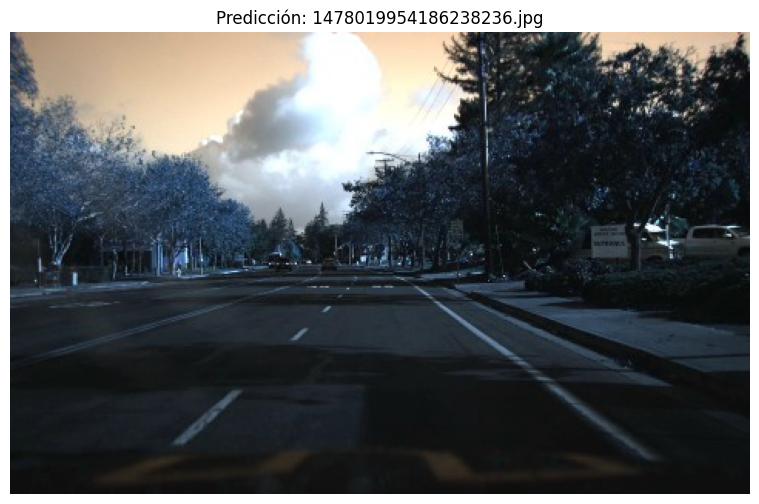


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1479504676893226303.jpg: 416x640 2 trucks, 7 pedestrians, 2.5ms
Speed: 1.1ms preprocess, 2.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


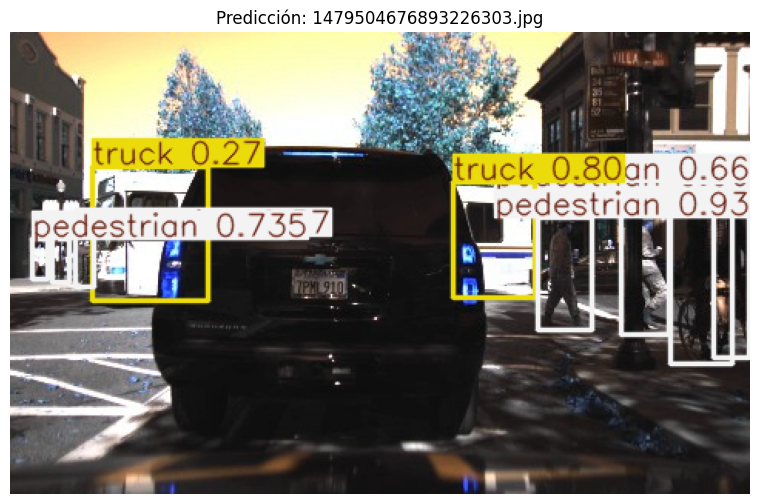


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1479500664617988455.jpg: 416x640 1 truck, 2.6ms
Speed: 1.0ms preprocess, 2.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


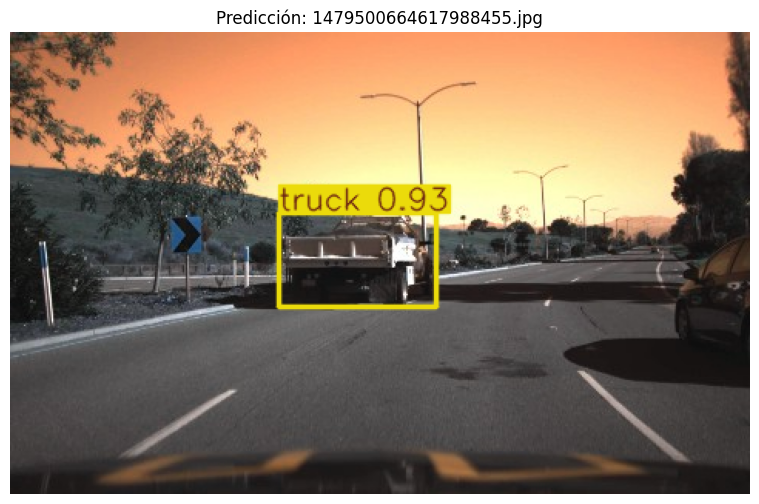


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1478900967384016587.jpg: 416x640 1 truck, 2.6ms
Speed: 1.1ms preprocess, 2.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


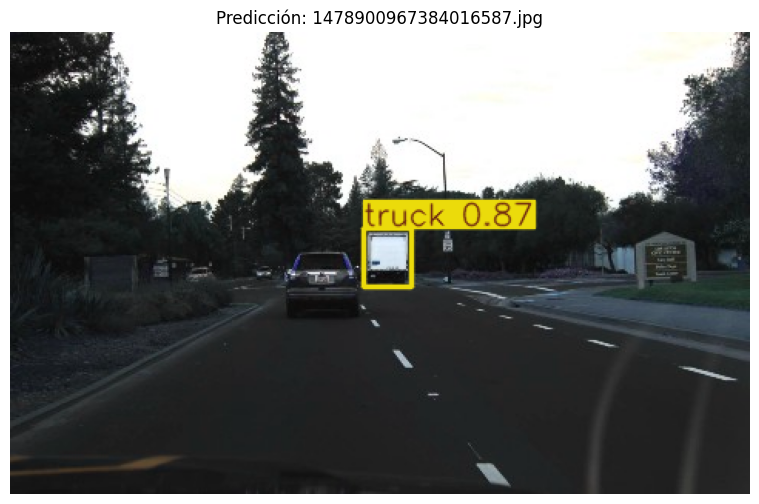


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1479499905068751457.jpg: 416x640 (no detections), 2.5ms
Speed: 1.0ms preprocess, 2.5ms inference, 0.4ms postprocess per image at shape (1, 3, 416, 640)


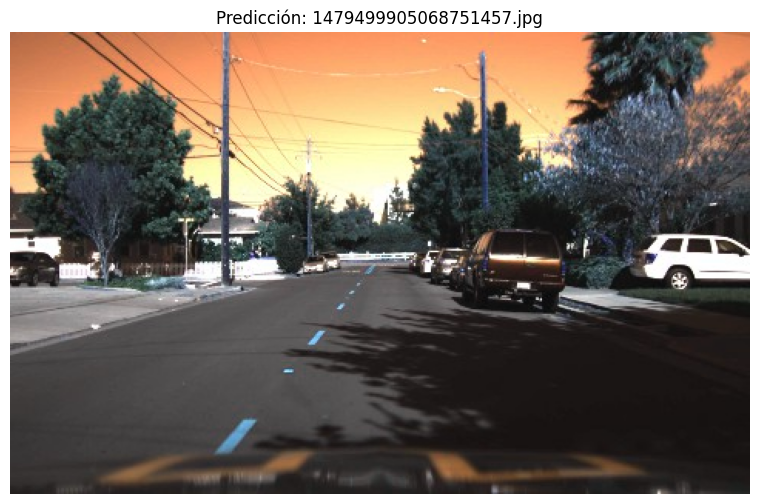


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1478897447668334273.jpg: 416x640 2 cars, 2 pedestrians, 2.5ms
Speed: 1.0ms preprocess, 2.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


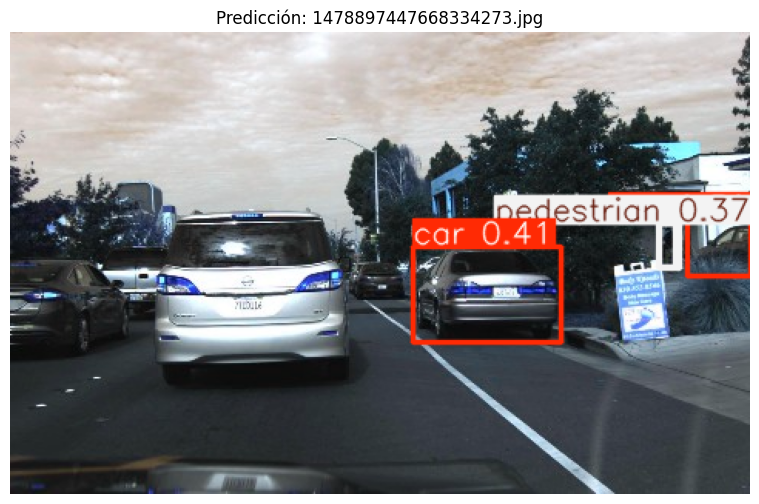


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1478020934720360832.jpg: 416x640 2 lights, 2.5ms
Speed: 1.0ms preprocess, 2.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


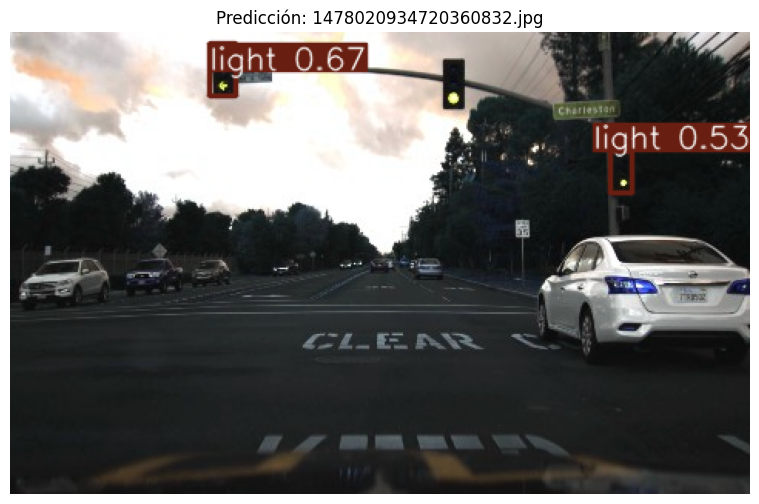


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1478896329082497901.jpg: 416x640 1 car, 2.6ms
Speed: 1.0ms preprocess, 2.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


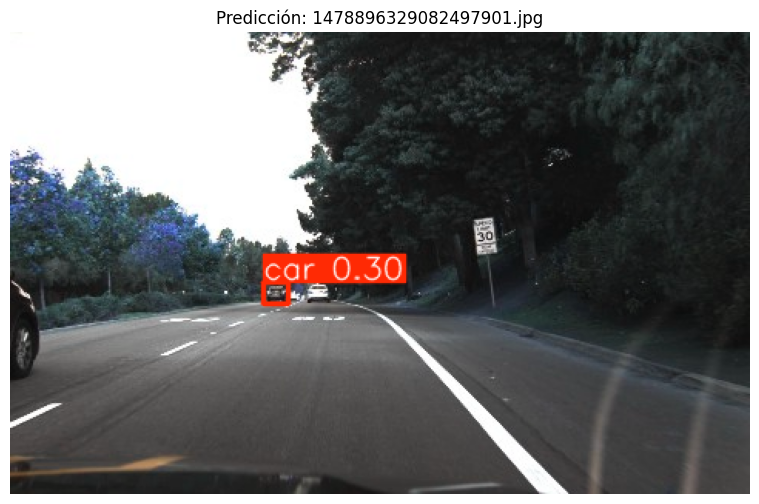


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1479502323732793462.jpg: 416x640 1 pedestrian, 2.4ms
Speed: 1.0ms preprocess, 2.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


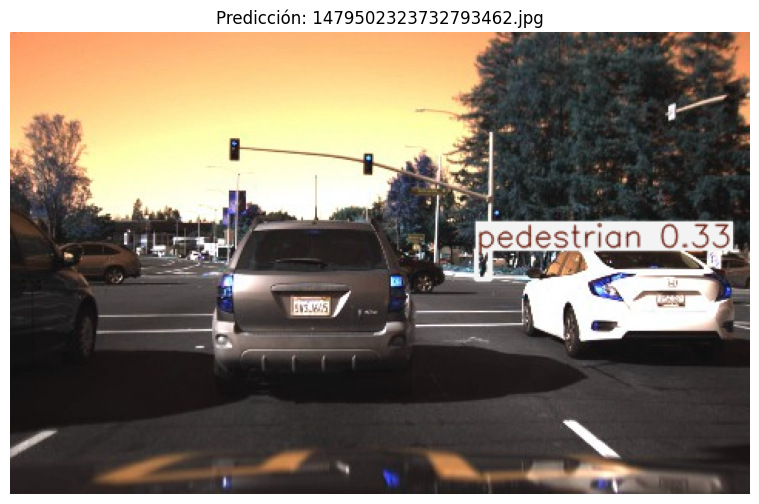


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1478898611384621090.jpg: 416x640 1 truck, 5 pedestrians, 2.6ms
Speed: 1.0ms preprocess, 2.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


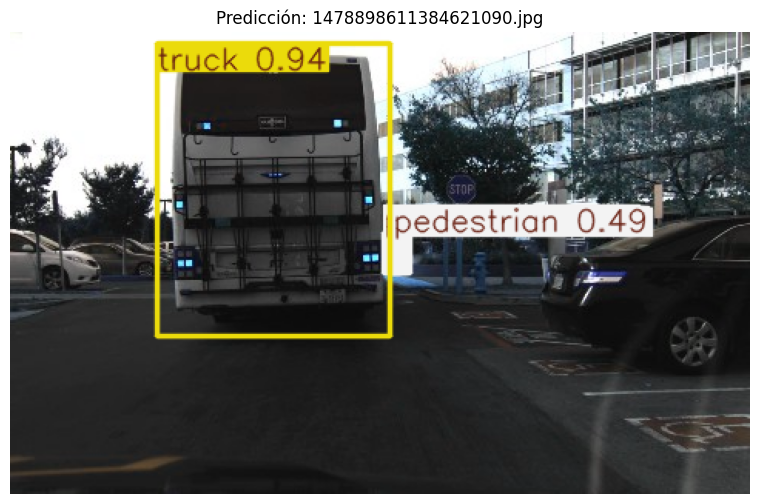


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1478899496312975442.jpg: 416x640 1 pedestrian, 1 bicyclist, 2.4ms
Speed: 1.0ms preprocess, 2.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


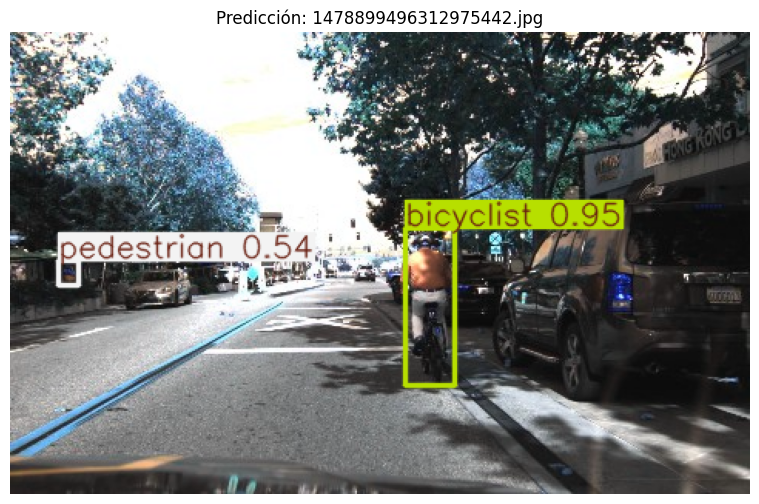


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1478899303216565031.jpg: 416x640 2 pedestrians, 4 lights, 2.4ms
Speed: 0.9ms preprocess, 2.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


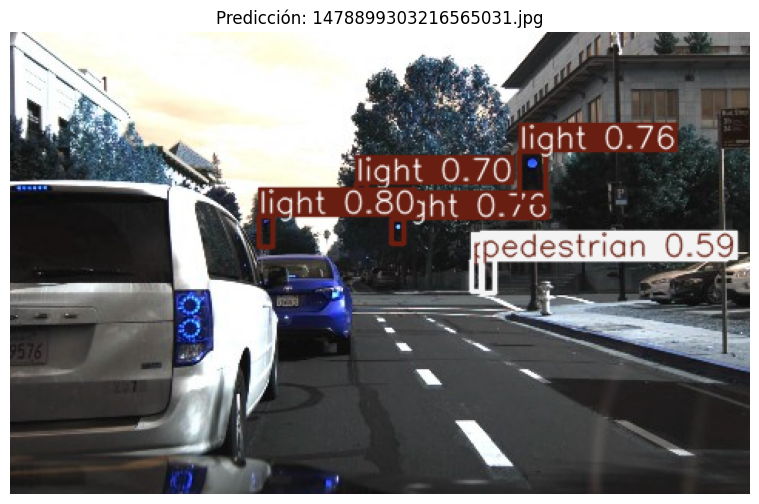


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1478898062375428280.jpg: 416x640 2 trucks, 2.5ms
Speed: 1.0ms preprocess, 2.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


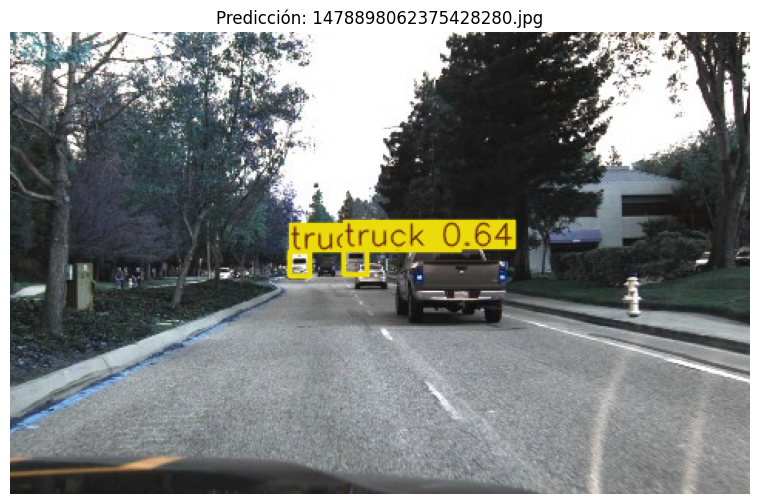


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1478020495206210884.jpg: 416x640 6 lights, 2.5ms
Speed: 1.0ms preprocess, 2.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


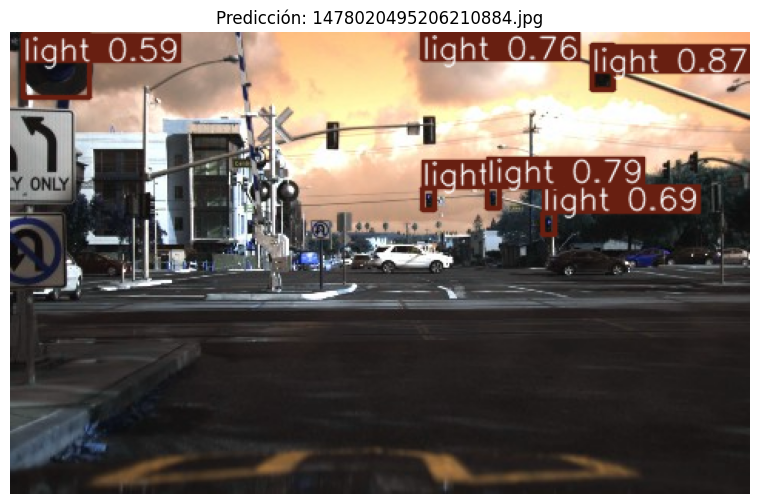


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1479505989478743526.jpg: 416x640 (no detections), 2.5ms
Speed: 1.0ms preprocess, 2.5ms inference, 0.4ms postprocess per image at shape (1, 3, 416, 640)


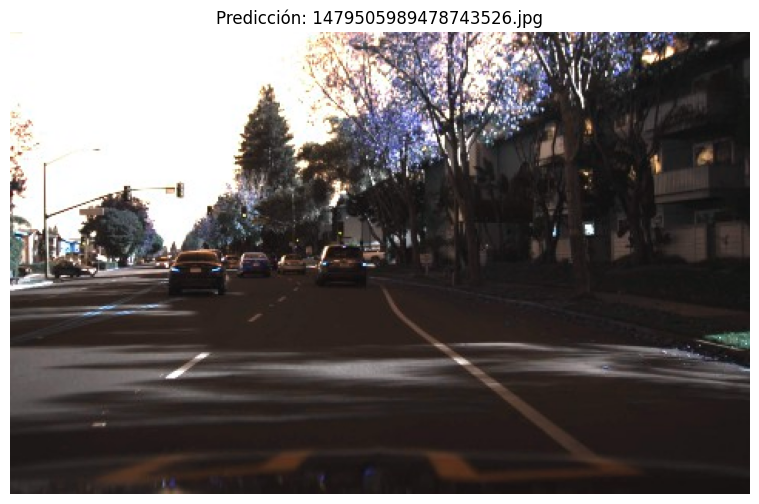


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1479505677440459706.jpg: 416x640 (no detections), 2.5ms
Speed: 1.0ms preprocess, 2.5ms inference, 0.4ms postprocess per image at shape (1, 3, 416, 640)


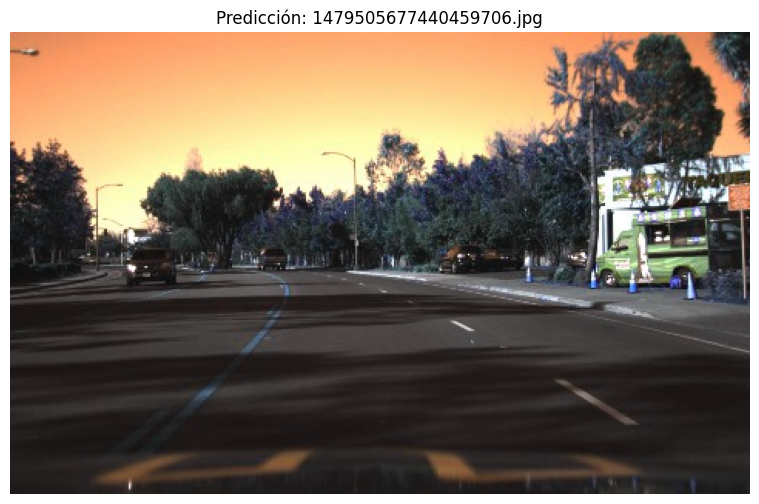


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1478732796944479792.jpg: 416x640 1 truck, 2 lights, 2.5ms
Speed: 1.0ms preprocess, 2.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


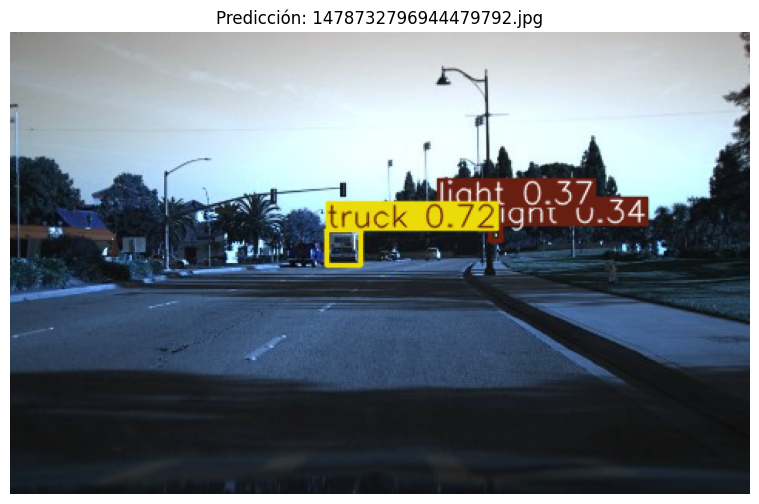


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1479500528611297018.jpg: 416x640 1 car, 1 truck, 1 pedestrian, 2.5ms
Speed: 1.0ms preprocess, 2.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


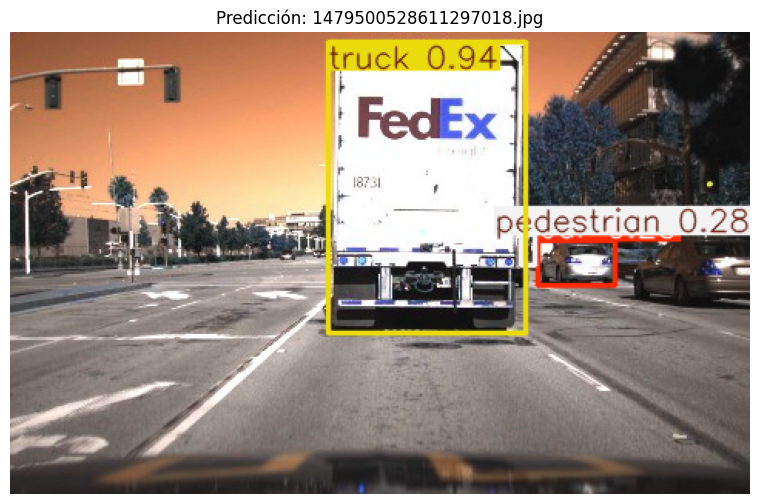


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1478899152967623642.jpg: 416x640 1 truck, 1 bicyclist, 2.5ms
Speed: 1.0ms preprocess, 2.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


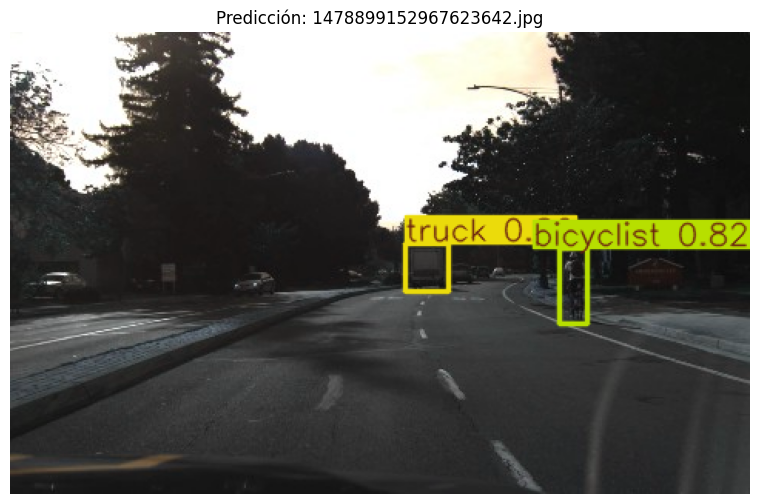


image 1/1 /home/paul-h-roldan-hernandez/Documentos/Diplomado/Proyecto/Passive Vehicular Sensors/yolo_dataset/images/val/1479501948209654832.jpg: 416x640 2 trucks, 2.6ms
Speed: 1.2ms preprocess, 2.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


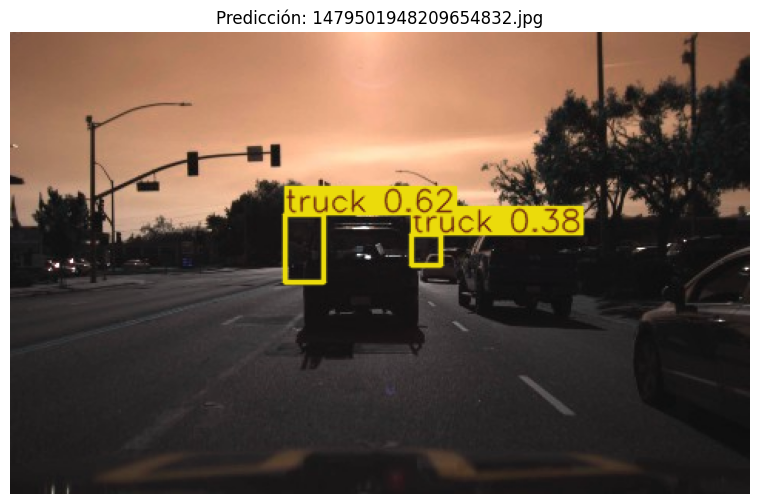

In [31]:
model = YOLO('runs/detect/object_detection_yolo/weights/best.pt')

# Ruta a imágenes de validación
val_img_dir = 'yolo_dataset/images/val'
val_images = glob(os.path.join(val_img_dir, '*.jpg'))  # Cambia a *.png si aplica

# Número de imágenes a visualizar
num_imgs_to_show = 20
selected_imgs = val_images[:num_imgs_to_show]

# Visualizar predicciones
for img_path in selected_imgs:
    # Hacer inferencia
    results = model(img_path)[0]

    # Cargar imagen y dibujar predicciones
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    annotated_img = results.plot()

    # Mostrar imagen
    plt.figure(figsize=(10, 6))
    plt.imshow(annotated_img)
    plt.title(f"Predicción: {os.path.basename(img_path)}")
    plt.axis('off')
    plt.show()